# 1. Point methods for single image

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from matplotlib import colors

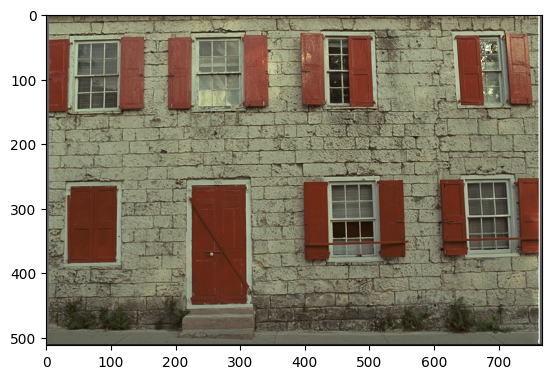

In [5]:
img = cv2.imread('images/kodim01.png')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB)) # default is BGR

Define some helping functions

In [73]:
def show(img,title=""):
    '''
    function displaying colour image or in gray scale
    '''
    if img.ndim == 2:                   #check dimensons of matrix
        plt.imshow(img,cmap='gray')
    else:
        plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.title(title)


def showhist(img):
    '''
    funkcja wyświetlająca obraz wraz z jego histogramem
    function displaying image witch its histogram
    '''
    plt.figure(figsize=(10,5), dpi= 80)
    plt.subplot(1,2,1)
    show(img)
    plt.subplot(1,2,2)

    if img.ndim == 3:
        colour = ('b','g','r')
        for i,col in enumerate(colour):
            histr = cv2.calcHist([img],[i],None,[256],[0,256])
            plt.plot(histr,colour = col)
            plt.xlim([0,256])
        plt.show()
    else:
        histr = cv2.calcHist([img],[0],None,[256],[0,256])
        plt.plot(histr)
        plt.xlim([0,256])
        plt.show()    
        
def showlut(img,lut):
    '''
    wyswielanie obrazu oraz wyniku zastosowania LUT
    '''
    img_out = cv2.LUT(img,lut)
    plt.figure(figsize=(15,5), dpi= 80)
    plt.subplot(1,3,1)
    show(img)
    plt.subplot(1,3,2)
    plt.plot(lut[0,:], color = 'b' )
    plt.xlim([0,256])
    plt.ylim([0,256])
    plt.subplot(1,3,3)
    show(img_out)
    
    #return img_out

In [74]:
help(show)
help(showhist)
help(showlut)

Help on function show in module __main__:

show(img, title='')
    function displaying colour image or in gray scale

Help on function showhist in module __main__:

showhist(img)
    funkcja wyświetlająca obraz wraz z jego histogramem
    function displaying image witch its histogram

Help on function showlut in module __main__:

showlut(img, lut)
    wyswielanie obrazu oraz wyniku zastosowania LUT



## 1.1 Tone curve, correction table and arithmetic operations

The pixel value of the output image in point methods depends only on the pixel with the same coordinates in the input image. **This relationship is described by the tone curve - a function showing the relationship between the brightness in the output image and the brightness in the input image**. In practical applications, the point operation is performed using a **correction table** which stores information about what values ​​in the output image should be assigned to individual brightnesses in the input image.

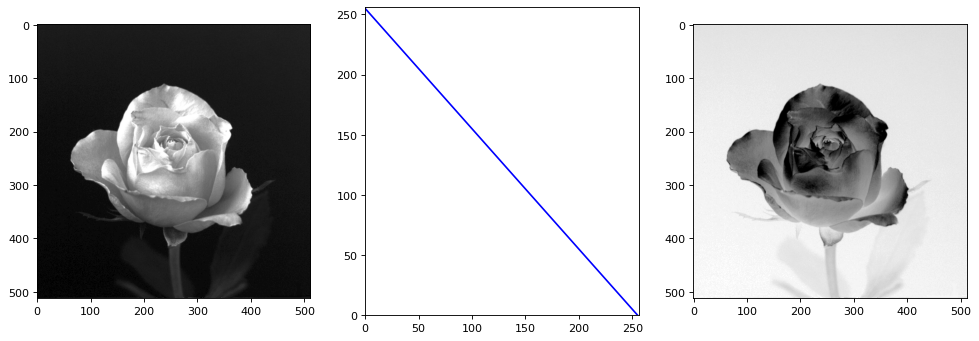

In [22]:
img = cv2.imread('images/rose.png')
lut = np.empty((1,256), np.uint8)
for i in range(256):
    lut[0,i] = 255 - i
showlut(img,lut)

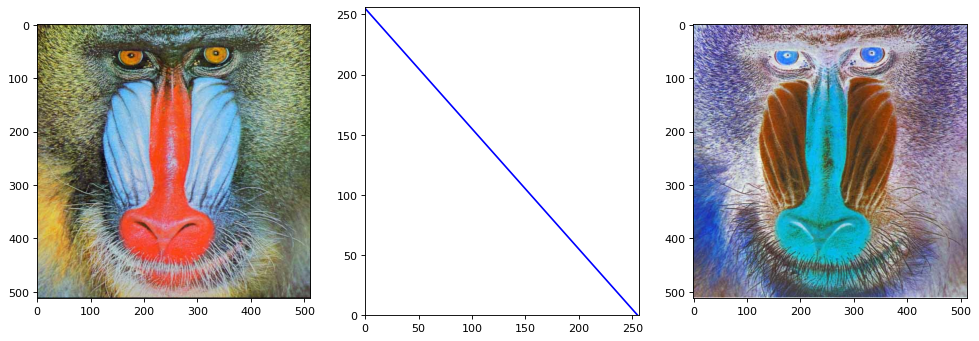

In [23]:
img = cv2.imread('images/baboon.jpg')
lut = np.empty((1,256), np.uint8)
for i in range(256):
    lut[0,i] = 255 - i
showlut(img,lut)

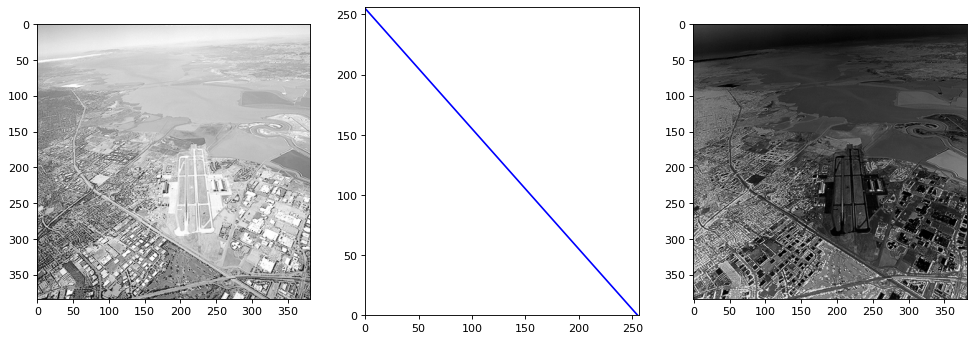

In [24]:
img = cv2.imread('images/airport.png')
lut = np.empty((1,256), np.uint8)
for i in range(256):
    lut[0,i] = 255 - i
showlut(img,lut)

**Arithmetical operations**: adding, substracting, multiplying and dividing by a number

In [25]:
def lut_aritm(num,mul):
    '''
    generate LUT list for arithmetic operations
    '''
    lut = np.empty((1,256), np.uint8)
    for i in range(256):
         lut[0,i] = np.clip(i*mul + num, 0, 255) 
            #CLIP - Given an interval, values outside the interval are clipped to the interval edges. 
            #For example, if an interval of [0, 1] is
            #specified, values smaller than 0 become 0, and values larger than 1 become 1
    return lut

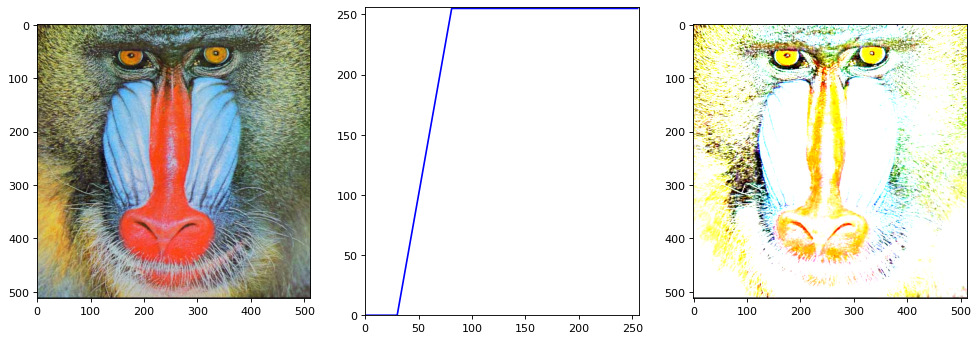

In [28]:
o = cv2.imread('images/baboon.jpg')
num = -150
mul = 5
showlut(o,lut_aritm(num,mul))

>There is a possibility to `upgrade` a quality of specific image 

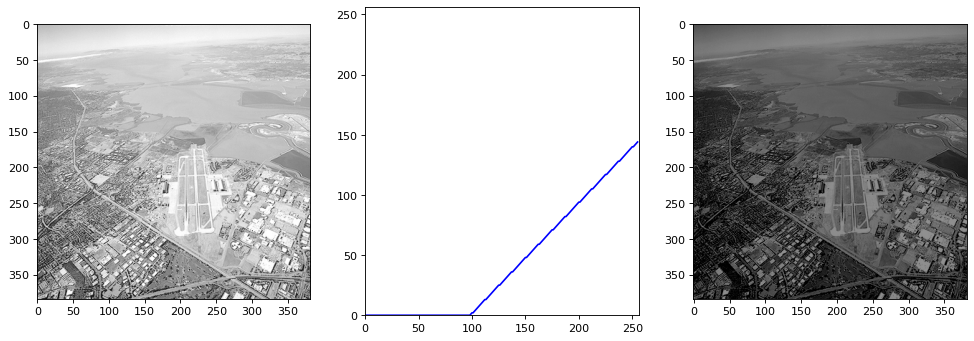

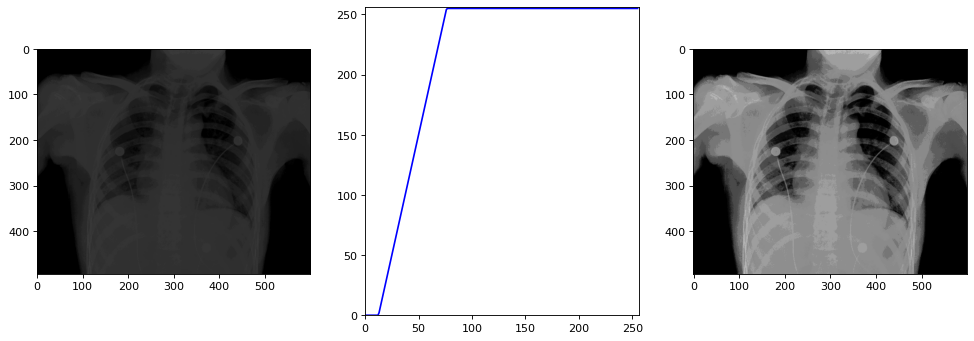

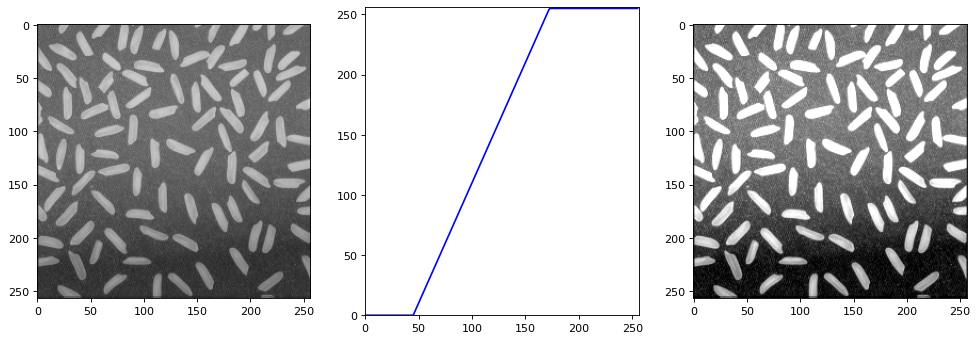

In [45]:
b = cv2.imread('images/airport.png')
num = -90
mul = 0.92
showlut(b,lut_aritm(num, mul))

c = cv2.imread('images/rtg.tif')
num = -50
mul = 4
showlut(c,lut_aritm(num, mul))

d = cv2.imread('images/rice.tif')
num = -90
mul = 2
showlut(d,lut_aritm(num, mul))

## 1.2 Gamma corection and operations based on histogram

**Gamma corection** allows us to upgrade a constrast of images.

In [50]:
def lut_gamma(gamma): 
    '''
    corection list for gamma cerection
    '''
    lut = np.empty((1,256), np.uint8)
    for i in range(256):
        lut[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)
    return lut

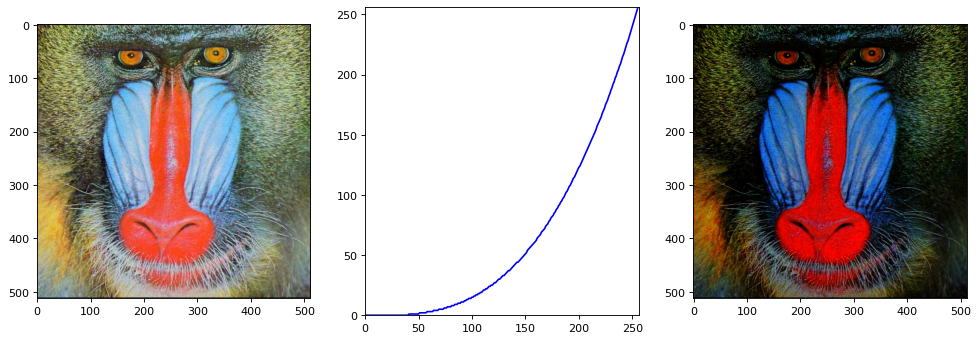

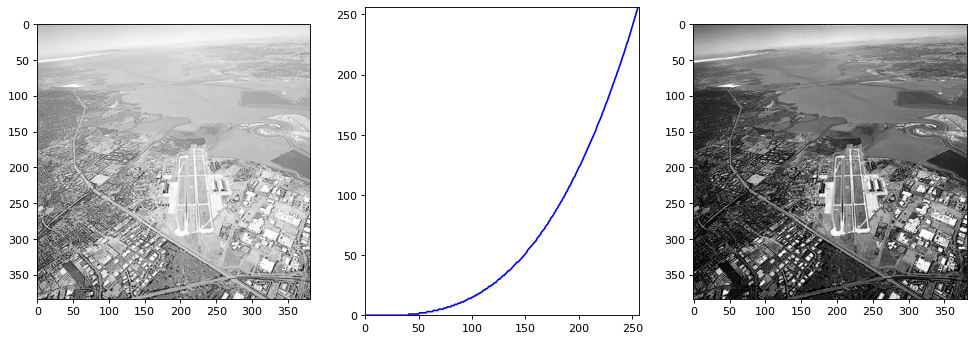

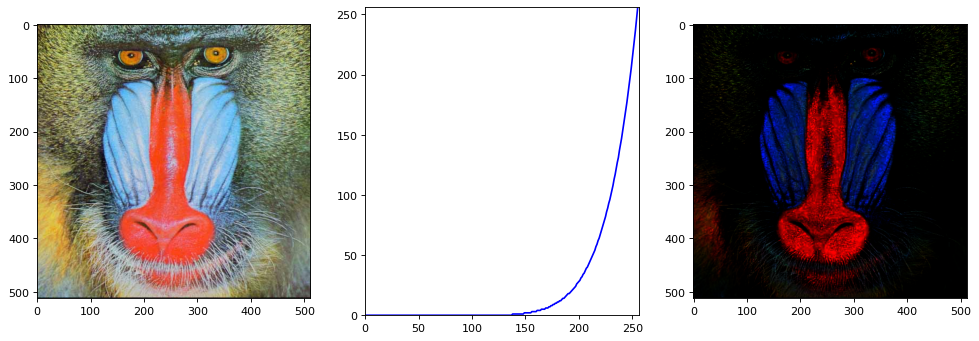

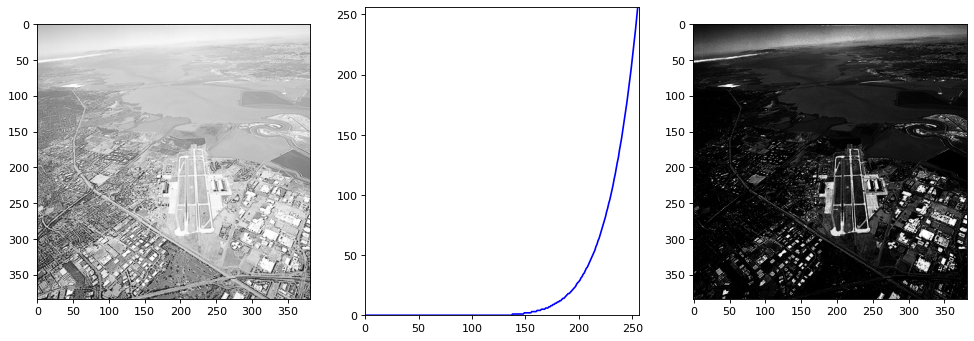

In [52]:
gamma = 3
showlut(o,lut_gamma(gamma))
showlut(b,lut_gamma(gamma))

gamma = 9
showlut(o,lut_gamma(gamma))
showlut(b,lut_gamma(gamma))

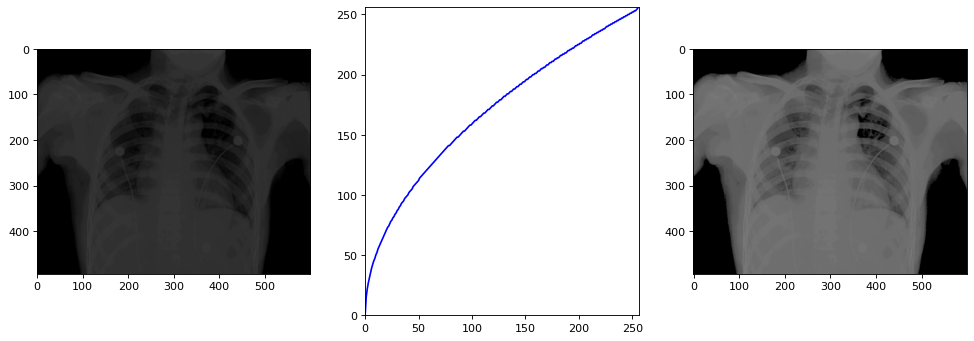

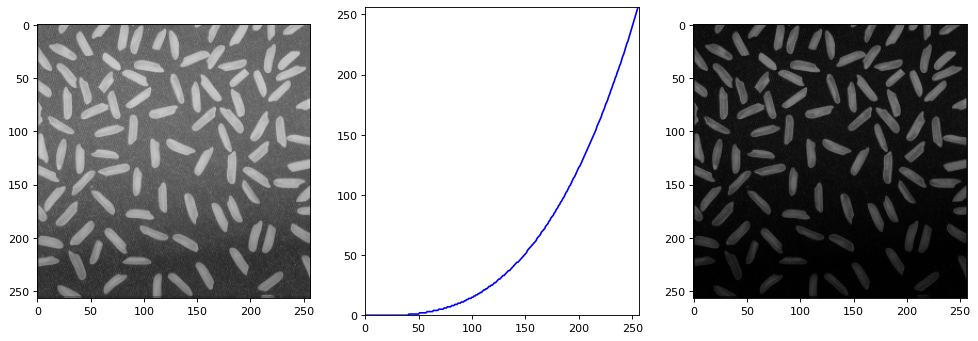

In [65]:
o = cv2.imread('images/rtg.tif')
b = cv2.imread('images/rice.tif')

gamma = 0.5
showlut(o,lut_gamma(gamma))
gamma = 3
showlut(b,lut_gamma(gamma))

Transformation that extends the scale of shades of gray in the image so that it starts from full black (point value = 0) to full white (point value = 255). This operation is called **histogram stretching**. Such
the transformation increases the contrast of the image by increasing the spacing between successive brightnesses in the image.

In [66]:
def lut_stretch(wmin,wmax):
    '''
    correction list for histogram stretch
    '''
    lut = np.empty((1,256), np.uint8)
    for i in range(256):
        if i<wmin:
            lut[0,i] = 0
        elif i>wmax:
            lut[0,i] = 255
        else:
            lut[0,i] = int(float((i - wmin)*255)/float(wmax - wmin))
    return lut

min = 0  , max = 58


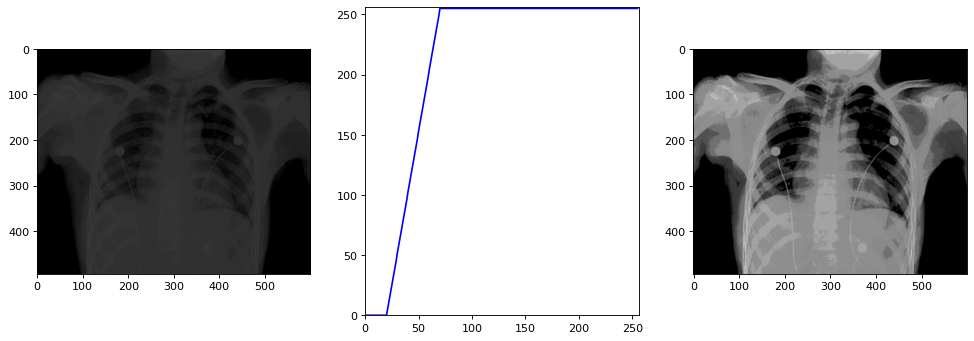

In [69]:
wmin = 20
wmax = 70
showlut(o,lut_stretch(wmin,wmax))
print('min =',o.min()," , max =",o.max())

Histogram stretching allows you to increase the contrast of low dynamic images.

original image


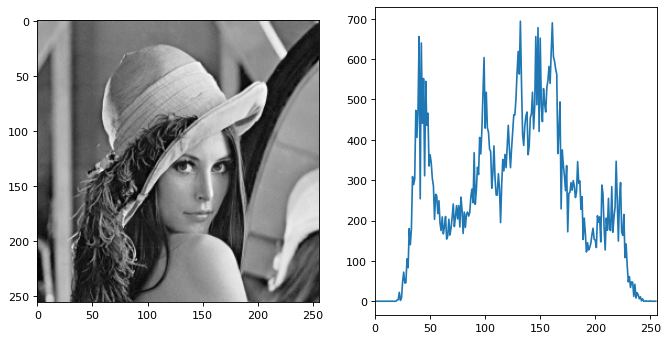

worse dynamic image


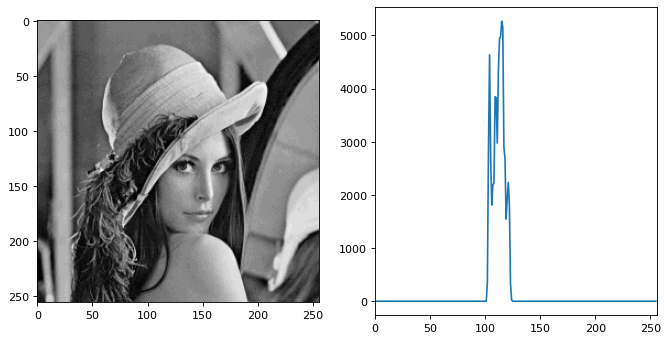

min= 102 max= 125
repaired image


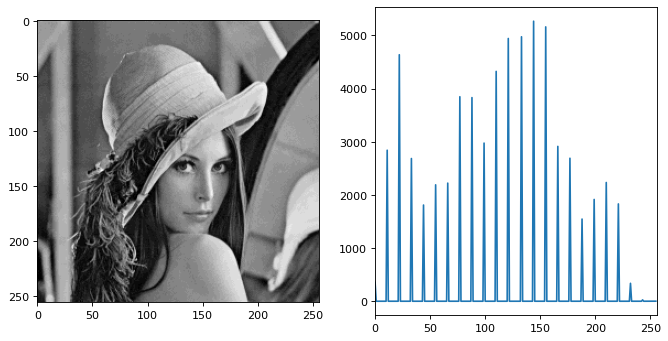

In [79]:
o = cv2.imread('images/lena.png', 0)
print("original image")
showhist(o)

print("worse dynamic image")
o2 = cv2.LUT(o,lut_aritm(100,0.1))
showhist(o2)
print("min=",o2.min(),"max=",o2.max())

print("repaired image")
o3 = cv2.LUT(o2,lut_stretch(o2.min(),o2.max()))
showhist(o3)

Equalizing histogram allows to improve image sharpness


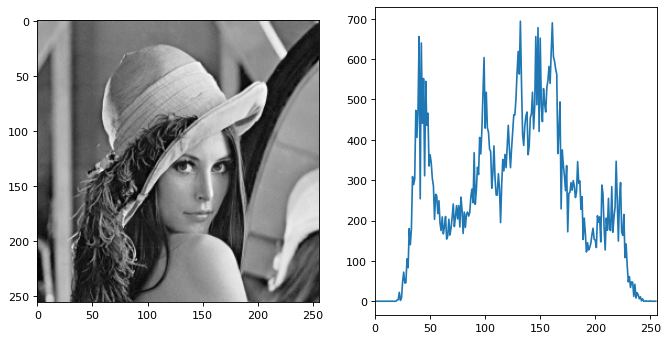

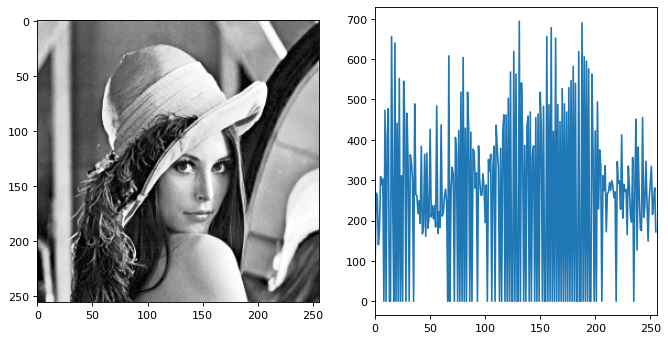

In [80]:
lena = cv2.imread('images/lena.png',0)
showhist(lena)
lena_wh = cv2.equalizeHist(lena)
showhist(lena_wh)

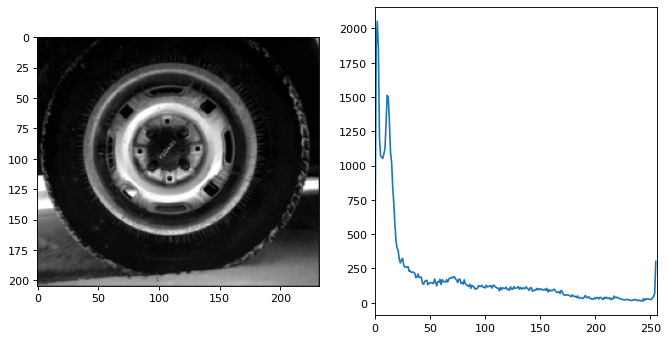

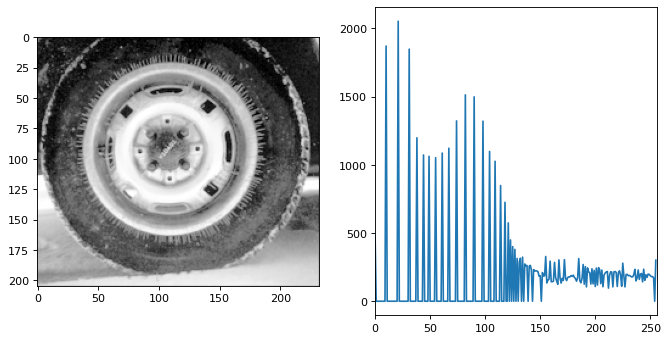

In [81]:
tire = cv2.imread('images/tire.tif',0)
showhist(tire)
tire_wh = cv2.equalizeHist(tire)
showhist(tire_wh)

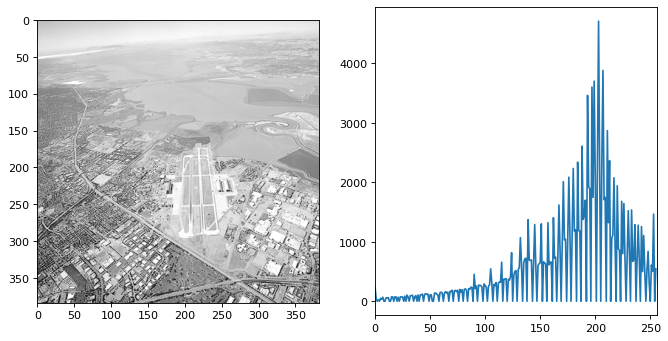

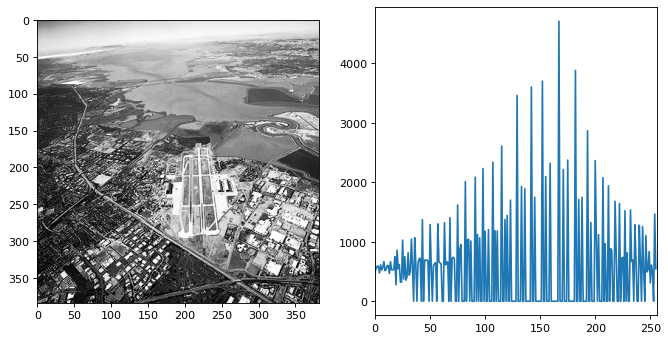

In [82]:
air = cv2.imread('images/airport.png',0)
showhist(air)
air_wh = cv2.equalizeHist(air)
showhist(air_wh)

## 1.3 Manipulating brightness levels, thresholding 

Thresholding is the simplest method of converting a grayscale or color image into a binary image. The method parameter is a threshold or thresholds defining the cut-off brightness level. They can be set manually or automatically.

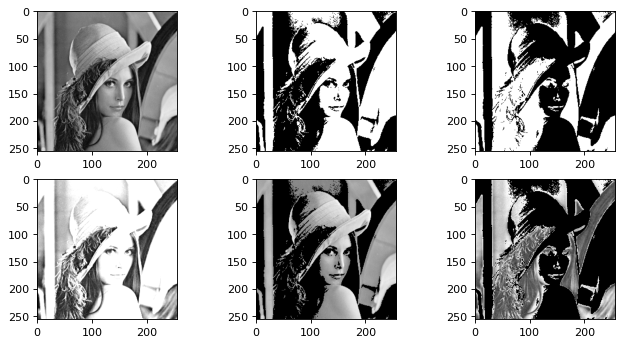

In [85]:
# differen tresholding methods for image in grey scale
lena = cv2.imread('images/lena.png',0)
down, up = 127, 255
prg = np.zeros((256,256,5), np.uint8)
ret, prg[:,:,0] = cv2.threshold(lena,down,up,cv2.THRESH_BINARY)
ret, prg[:,:,1] = cv2.threshold(lena,down,up,cv2.THRESH_BINARY_INV)
ret, prg[:,:,2] = cv2.threshold(lena,down,up,cv2.THRESH_TRUNC)
ret, prg[:,:,3] = cv2.threshold(lena,down,up,cv2.THRESH_TOZERO)
ret, prg[:,:,4] = cv2.threshold(lena,down,up,cv2.THRESH_TOZERO_INV)

plt.figure(figsize=(10,5), dpi= 80)
plt.subplot(2,3,1)
show(lena) 

for i in range(0,5):
    plt.subplot(2,3,i+2)
    show(prg[:,:,i]) 

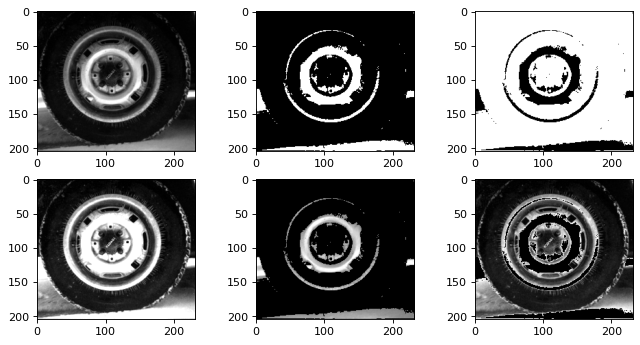

In [86]:
tire = cv2.imread('images/tire.tif',0)
down, up = 127, 155
prg = np.zeros((205,232,5), np.uint8)
ret, prg[:,:,0] = cv2.threshold(tire,down,up,cv2.THRESH_BINARY)
ret, prg[:,:,1] = cv2.threshold(tire,down,up,cv2.THRESH_BINARY_INV)
ret, prg[:,:,2] = cv2.threshold(tire,down,up,cv2.THRESH_TRUNC)
ret, prg[:,:,3] = cv2.threshold(tire,down,up,cv2.THRESH_TOZERO)
ret, prg[:,:,4] = cv2.threshold(tire,down,up,cv2.THRESH_TOZERO_INV)

plt.figure(figsize=(10,5), dpi= 80)
plt.subplot(2,3,1)
show(tire) 
for i in range(0,5):
    plt.subplot(2,3,i+2)
    show(prg[:,:,i])

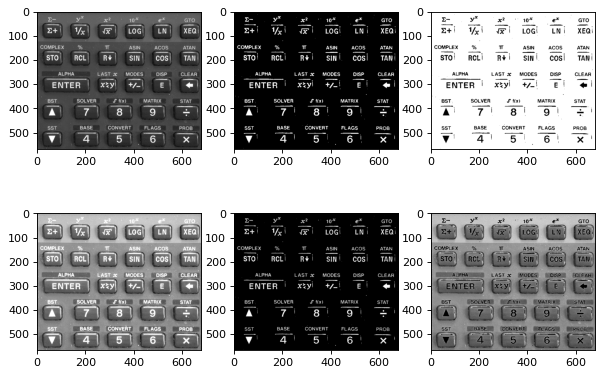

In [88]:
# tresholding allows us to make more visible explitic parts of an image
calc = cv2.imread('images/calc.png',0)
down, up = 127, 155
prg = np.zeros((567,680,5), np.uint8)
ret, prg[:,:,0] = cv2.threshold(calc,down,up,cv2.THRESH_BINARY)
ret, prg[:,:,1] = cv2.threshold(calc,down,up,cv2.THRESH_BINARY_INV)
ret, prg[:,:,2] = cv2.threshold(calc,down,up,cv2.THRESH_TRUNC)
ret, prg[:,:,3] = cv2.threshold(calc,down,up,cv2.THRESH_TOZERO)
ret, prg[:,:,4] = cv2.threshold(calc,down,up,cv2.THRESH_TOZERO_INV)

plt.figure(figsize=(9,6), dpi= 80)
plt.subplot(2,3,1)
show(calc) 

for i in range(0,5):
    plt.subplot(2,3,i+2)
    show(prg[:,:,i])

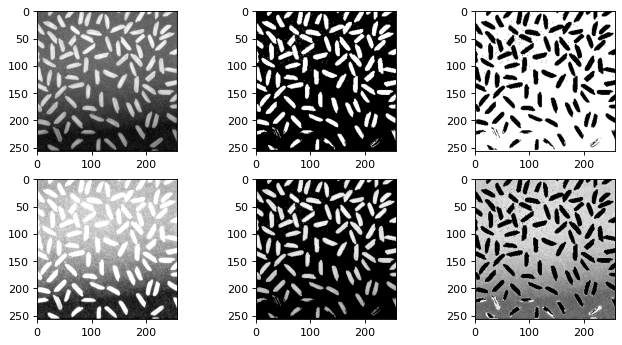

In [95]:
# progowanie obrazu w skali szarości
rice = cv2.imread('images/rice.tif', 0)
down, up = 127, 155
prg = np.zeros((257,257,5), np.uint8)
ret, prg[:,:,0] = cv2.threshold(rice,down,up,cv2.THRESH_BINARY)
ret, prg[:,:,1] = cv2.threshold(rice,down,up,cv2.THRESH_BINARY_INV)
ret, prg[:,:,2] = cv2.threshold(rice,down,up,cv2.THRESH_TRUNC)
ret, prg[:,:,3] = cv2.threshold(rice,down,up,cv2.THRESH_TOZERO)
ret, prg[:,:,4] = cv2.threshold(rice,down,up,cv2.THRESH_TOZERO_INV)

plt.figure(figsize=(10,5), dpi= 80)
plt.subplot(2,3,1)
show(rice) 

for i in range(0,5):
    plt.subplot(2,3,i+2)
    show(prg[:,:,i])

Otsu method, optimizing the threshold value using statistical measures.

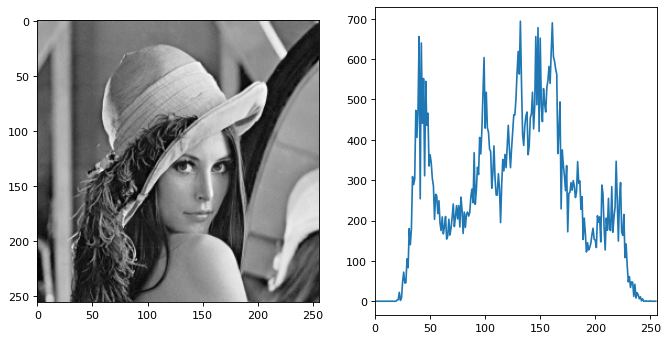

treshold =  118.0


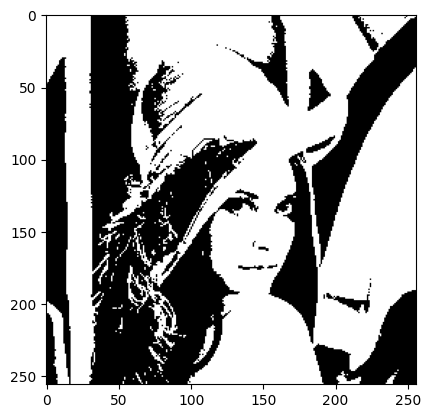

In [97]:
showhist(lena)
ret, otsu = cv2.threshold(lena,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print("treshold = ",ret)
show(otsu)

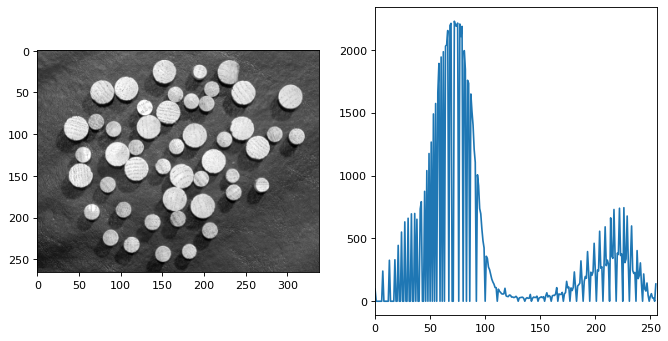

treshold =  140.0


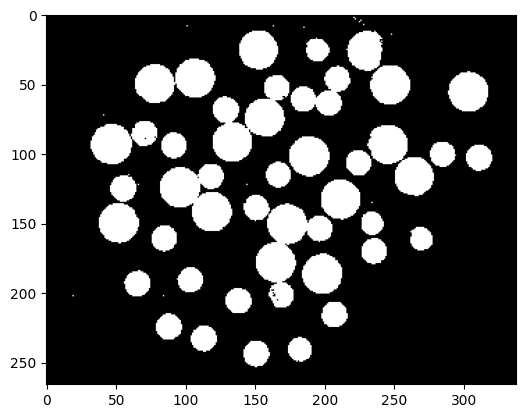

In [99]:
dowels = cv2.imread('images/dowels.png', 0)
showhist(dowels)
ret, otsu = cv2.threshold(dowels,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print("treshold = ",ret)
show(otsu)

## 1.5 Color segmentation

In [100]:
def color_rgb(img):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    r, g, b = cv2.split(img_rgb)
    fig = plt.figure(figsize=(10,5), dpi= 80)
    plt.subplot(1,2,1)
    show(img)  
    axis = fig.add_subplot(1,2, 2, projection="3d")
    px_colors = img_rgb.reshape((np.shape(img_rgb)[0]*np.shape(img_rgb)[1], 3))
    norm = colors.Normalize(vmin=-1.,vmax=1.)
    norm.autoscale(px_colors)
    px_colors = norm(px_colors).tolist()
    axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=px_colors, marker=".")
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue")
    plt.show()
    

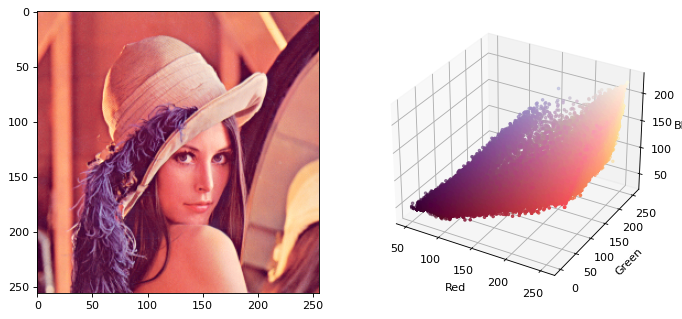

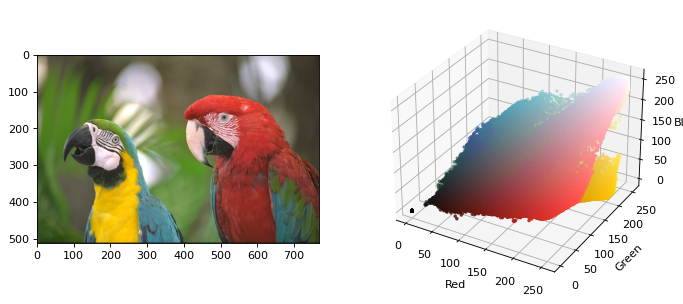

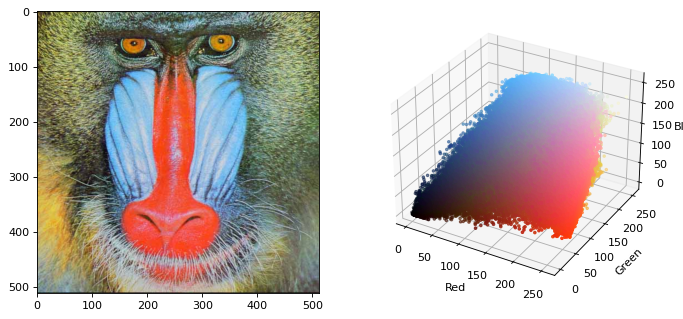

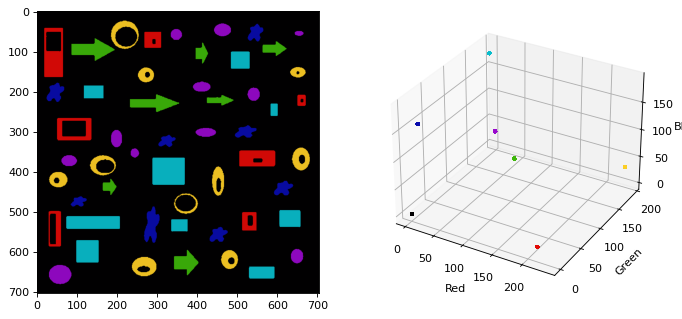

In [104]:
img = [cv2.imread('images/lena.png'), cv2.imread('images/kodim23.png'), cv2.imread('images/baboon.jpg'), cv2.imread('images/obj.png')]

for x in img:
    color_rgb(x)


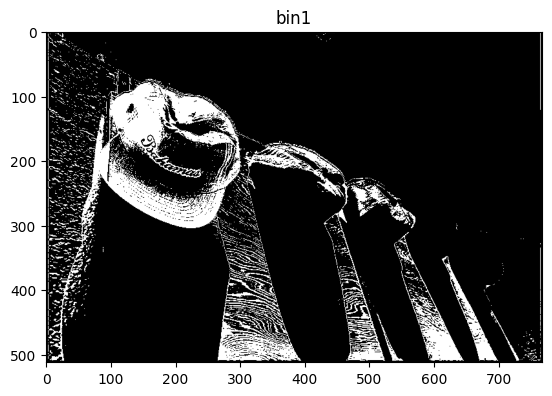

In [105]:
img = cv2.imread('images/kodim03.png')
show(img)
down = (10,70,80)
up = (90, 255, 255)
bin = cv2.inRange(img, down, up)
bin1 = cv2.cvtColor(bin, cv2.COLOR_BGR2RGB)
show(bin1,  'bin1')

# 2. Operation on multiple images

## 2.1 Arithmetic operations

Adding two images in two different ways

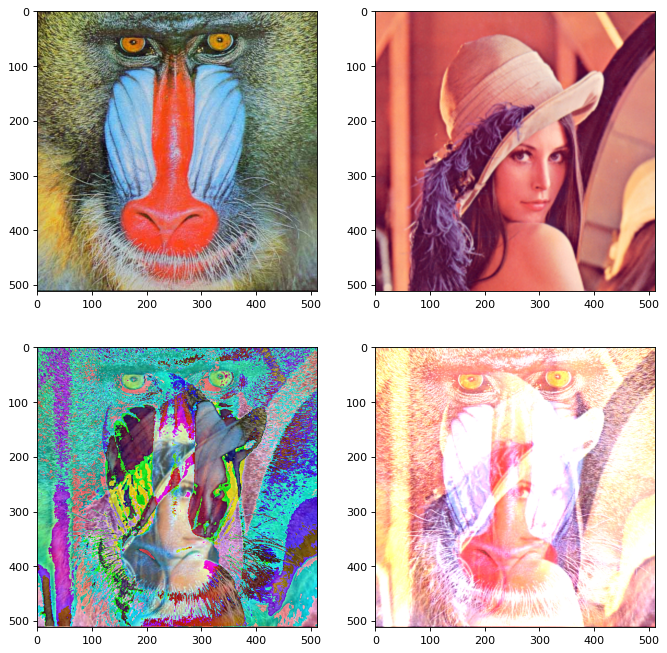

In [107]:
i1 = cv2.imread('images/baboon.jpg')
# funkcja imresize zmienia rozmiar obrazu
i2 = cv2.resize(cv2.imread('images/lena.png'),(512,512))
s1 = np.clip(i1 + i2, 0, 255)
s2 = cv2.add(i1,i2)
plt.figure(figsize=(10,10), dpi= 80)
plt.subplot(2,2,1)
show(i1)
plt.subplot(2,2,2)
show(i2)
plt.subplot(2,2,3)
show(s1)
plt.subplot(2,2,4)
show(s2)

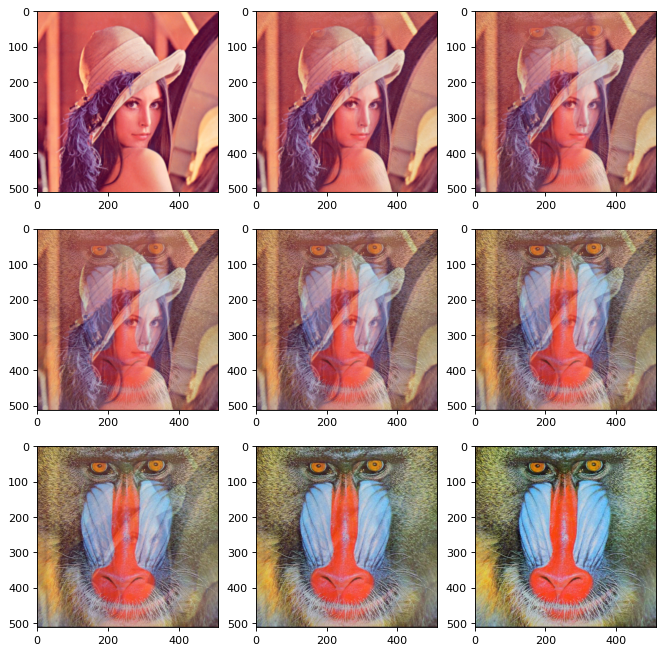

In [109]:

plt.figure(figsize=(10,10), dpi= 80)
for i in range(0,9):
    plt.subplot(3,3,i+1)
    mieszanka = cv2.addWeighted(i1,i/8,i2,1-i/8,0)
    show(mieszanka)


## 2.2 stenography - hiding data in another data

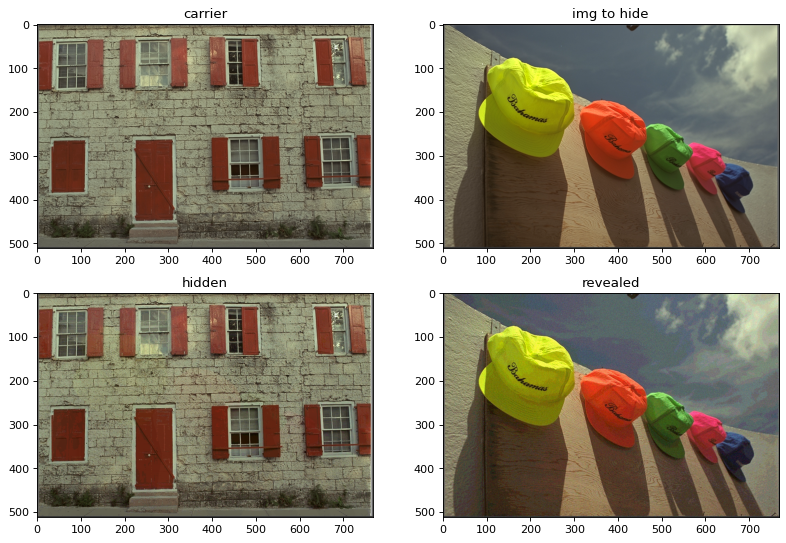

In [110]:
import random 
    
def hide(img1,img2): 
    '''
    hiding function
    '''
    ret = np.zeros((img1.shape[0] , img2.shape[1], 3), np.uint8) 
    for i in range(img2.shape[0]): 
        for j in range(img2.shape[1]): 
            for l in range(3): 
                # cutting off bits
                v1 = format(img1[i][j][l], '08b') 
                v2 = format(img2[i][j][l], '08b') 
                # join
                v3 = v1[:4] + v2[:4]  
                ret[i][j][l]= int(v3, 2) 
    return ret             
  

def reveal(img): 
    '''
    reveal function
    '''
    ret = np.zeros((img.shape[0] , img.shape[1] , 3), np.uint8) 
    for i in range(img.shape[0]): 
        for j in range(img.shape[1]): 
            for l in range(3): 
                pom = format(img[i][j][l], '08b') 
                ret[i][j][l]= int(pom[4:] + chr(random.randint(0, 1)+48) * 4, 2) 
    return ret  

      
img1 = cv2.imread('images/kodim01.png') 
img2 = cv2.imread('images/kodim03.png') 

coded = hide(img1,img2) 
decoded = reveal(coded) 

plt.figure(figsize=(12,8),dpi = 80)
plt.subplot(2,2,1)   
show(img1,"carrier")
plt.subplot(2,2,2)   
show(img2,"img to hide")
plt.subplot(2,2,3)   
show(coded,"hidden")
plt.subplot(2,2,4)   
show(decoded,"revealed")


## 2.3 Pseudocolor

Conversion grey scale image to a color one in case to improve it's readability

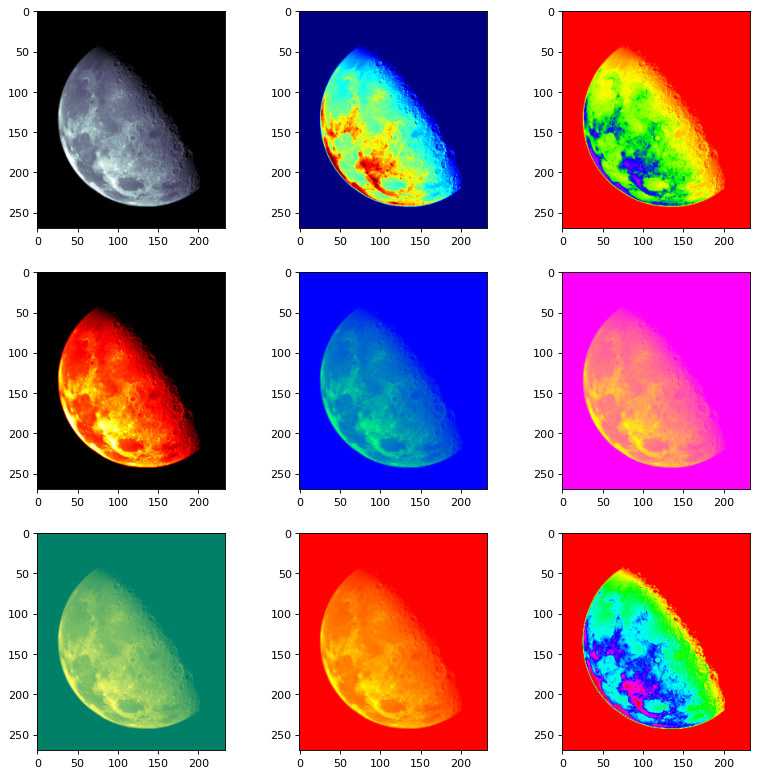

In [115]:
img = cv2.imread('images/moon.png',0)
maps = [ cv2.COLORMAP_BONE, cv2.COLORMAP_JET, cv2.COLORMAP_RAINBOW, cv2.COLORMAP_HOT, 
            cv2.COLORMAP_WINTER, cv2.COLORMAP_SPRING, cv2.COLORMAP_SUMMER, cv2.COLORMAP_AUTUMN, cv2.COLORMAP_HSV]
plt.figure(figsize=(12,12), dpi= 80)
for i, mkol in enumerate(maps):
    img_col = cv2.applyColorMap(img, mkol)
    plt.subplot(3,3,i+1)
    show(img_col)